In [15]:
import numpy as np
from matplotlib import pyplot as plt
import scipy as sp
from scipy.sparse import diags, kronsum
from scipy.sparse.linalg import eigsh

import sys
np.set_printoptions(threshold=sys.maxsize)

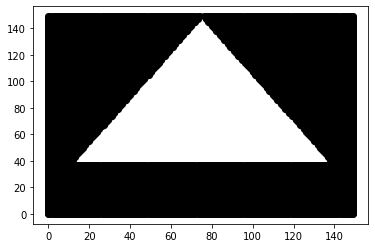

In [16]:
from matplotlib.patches import RegularPolygon
from matplotlib.path import Path

poly = RegularPolygon((75, 75), 3, 75)

g = np.mgrid[:150,:150]
coords = np.array(list(zip(*(c.flat for c in g))))

polypath = Path(poly.get_verts())
validcoords = np.invert(polypath.contains_points(coords))
points = coords[validcoords]

fig,ax=plt.subplots()
# ax.add_artist(poly)
ep=np.array(points)
ax.plot(points[:,0],points[:,1],'ko')
plt.show(block=False)

p = [[0 for i in range(150)] for j in range(150)]
for i in points:
    x = i[0]
    y = i[1]
    p[x][y] = 10000000000
    
P = np.array(p)

In [17]:
size = 150

x,y = np.mgrid[:size, :size]

In [18]:
differential_operator = diags([-1, 2, -1], [-1, 0, 1], (size, size))
laplacian = kronsum(differential_operator, differential_operator)

# Free Well
# V = 0*x

#Circular Well
# V = (x-75)**2 + (y-75)**2
# V[V<3000] = 0
# V[V>3000] = 1000

#Polygon
V = P

V = diags(V.reshape(size**2), 0)

H = -1/2*laplacian + V

In [19]:
H

<22500x22500 sparse matrix of type '<class 'numpy.float64'>'
	with 111900 stored elements in Compressed Sparse Row format>

In [20]:
energy_levels = 25
eigenvalues, eigenvectors = eigsh(H, energy_levels, which='SM')

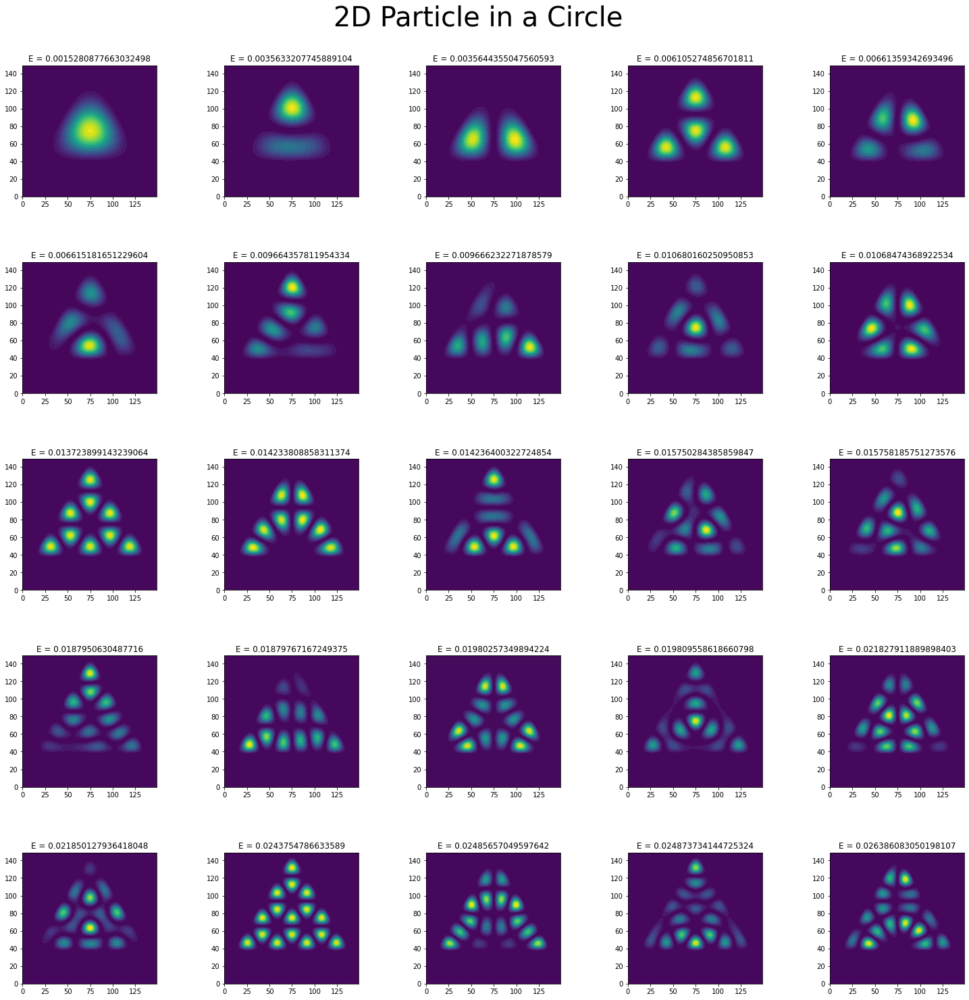

In [21]:
fig, axis = plt.subplots(5,5, figsize = (25,25))

fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle("2D Particle in a Circle", fontsize=40, y=0.93)

axis = axis.ravel()

for i in range(energy_levels):
    axis[i].contourf(x, y, (eigenvectors.T[energy_levels-1-i].reshape(size,size))**2, 25)
    axis[i].set_title("E = " + str(abs(eigenvalues[energy_levels-1-i])))

plt.savefig('2D Particle in a Triangle_Final.jpg')